In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
# Below code is for getting figure in center alignment
from IPython.core.display import HTML
HTML("""
<style>

.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}

</style>
""")

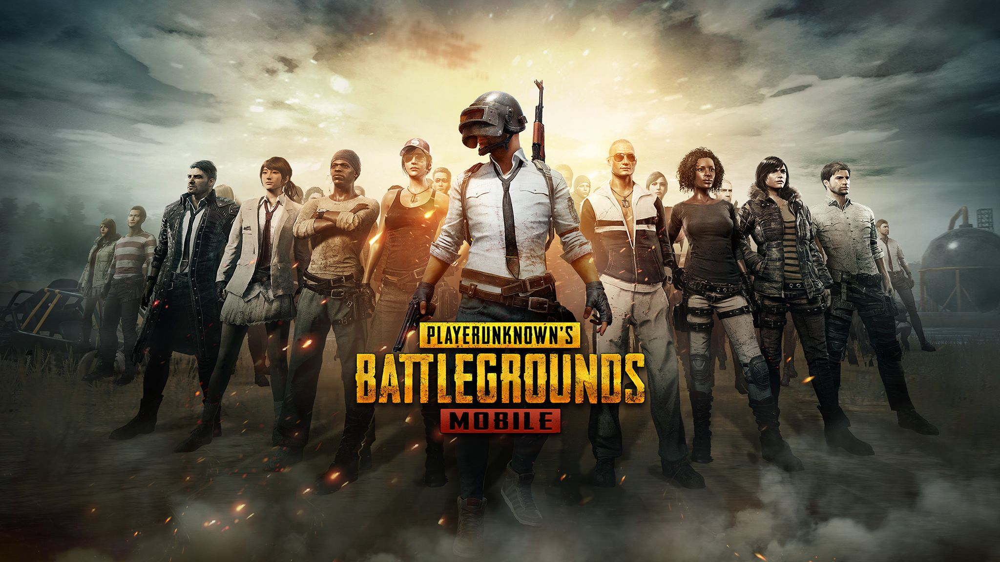

# PUBG:  Game AI - Winner Prediction
## Overview
The Data science project which is given here is Game AI - Winner Prediction.This is a PUBG game Data Set. The dataset contains a large number of anonymized game stats for a single player with all match types. The target is to create a ML model which predicts players' finishing placement based on their final stats.

In a PUBG game, up to 100 players start in each match (matchId). Players (Id) can be on teams (groupId) which get ranked at the end of the game (winPlacePerc) based on how many other teams are still alive when they are eliminated. During the game, players can pick up different amunitions, revive downed-but-not-dead (knocked) teammates, drive vehicles, swim, run, shoot, and experience all of the consequences -- such as falling too far or running themselves over and eliminating themselves.

The team at PUBG has made official game data available for the public to explore and scavenge outside of "The Blue Circle." 
You are provided with a large number of anonymized PUBG game stats, formatted so that each row contains one player's post-game stats. The data comes from matches of all types: solos, duos, squads, and custom; there is no guarantee of there being 100 players per match, nor at most 4 player per group.

The Goal and Insights of the project as follows:
* Explore the data
* Preprocessing the features
* A trained model which can predict the winPlacePerc based on factors as inputs.

# Dataset Description: 
This file contains 128962014 individual data points in 29 columns and 4446966 rows.<br>

* <b>groupId</b> - Integer ID to identify a group within a match. If the same group of players plays in different matches, they will have a different groupId each time.

* <b>matchId</b> - Integer ID to identify match. There are no matches that are in both the training and testing set.

* <b>assists</b> - Number of times you helped your friend when he killed an enemy
* <b>boosts</b> - Number of boost items used.

<b>What is it ?</b> Boost may refer to Energy Drink,Painkillers, Adrenaline Syringe
<br>
<b>About:</b> The boost bar is a thin white line visible above the health bar. It is cut into 4 sections, which fill up when the player uses a boost item. The first section of the boost bar lasts for 1 minute and will heal 1% health every 8 seconds, for a total of 7% health.
<br>
* <b>damageDealt</b> - Total damage dealt. Note: Self inflicted damage is subtracted.
* <b>DBNOs</b> - Number of enemy players knocked<br>

<b>What is it?</b> Stands for '<b>Down But No Out</b>'. During Duo or squad play, when you lose all your hit points(HP), you get into this mode. In this mode, your duo or squad members can heal you and that is why we don't count this as an out. 'Revive State' is a feature in BATTLEGROUNDS that can be used to revive downed squad mates. Once your HP reaches 0 you will go into a DBNO state. You can only crawl and drop items, but you cannot shoot or use items while in this state.

* <b>headshotKills</b> - Number of enemies you killed with headshots.
* <b>heals</b> - Number of healing items used.

<b>About:</b> There are three basic health items in PUBG: Bandages, First Aid Kits and Med Kits. These all restore your health bar.
<br>
* <b>killPlace</b> - Your ranking in match in terms of number of enemy players killed.
* <b>killPoints</b> - Kills-based external ranking of player. (Ranking where only winning matters).
* <b>kills</b> - Number of enemy players killed.
* <b>killStreaks</b> - Max number of enemy players killed in a short amount of time. A Killstreak is earned when a player acquires a certain number of kills in a row without dying.
* <b>longestKill</b> - Longest distance between player and player killed at time of death. This may be misleading, as downing a - player and driving away may lead to a large longestKill stat.
* <b>maxPlace</b> - Worst placement we have data for in the match. This may not match with numGroups, as sometimes the data skips over placements.
* <b>numGroups</b> - Number of groups we have data for in the match.
* <b>revives</b> - Number of times you revived your teammates.
* <b>rideDistance</b> - Total distance traveled in vehicles (measured in meters).
* <b>roadKills</b> - Number of enemy killed while travelling in a vehicle.
* <b>swimDistance</b> - Total distance traveled by swimming (measured in meters).
* <b>teamKills</b> - Number of times you are killed your teammate.
* <b>vehicleDestroys</b> - Number of vehicles destroyed.
* <b>walkDistance</b> - Total distance traveled on foot (measured in meters).
* <b>weaponsAcquired</b> - Number of weapons picked up.
* <b>winPoints</b> - Win-based external ranking of player. (Ranking where only winning matters).

<b>Target:</b>
* <b>winPlacePerc</b> - The target of prediction (Target Variable). This is a percentile winning placement, where 1 corresponds to 1st place, and 0 corresponds to last place in the match. 

<b>Feature Characteristics:</b>
* int IDs to identify players, groups and matches
* Discrete data about stats (assists, boosts, headshotKills)
* External rankings (based off of some post-match math): ELO scores
*  Certain features listed as inconsistent (rankPointsElo)

# Basic Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from scipy import stats
import plotly.express as px
# To avoid warinings
import warnings
warnings.filterwarnings('ignore')

# Reading data

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# Reading data
df = pd.read_csv('/content/drive/MyDrive/pubg.csv')
print(f"\033[32mDimension of data : {df.shape}")
df.head(3)

Dimension of data : (4446966, 29)


,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.0,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.8,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.0,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.0,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.0,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.8,2,0,0.7755


# Information about data

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4446966 entries, 0 to 4446965
Data columns (total 29 columns):
 #   Column           Dtype  
---  ------           -----  
 0   Id               object 
 1   groupId          object 
 2   matchId          object 
 3   assists          int64  
 4   boosts           int64  
 5   damageDealt      float64
 6   DBNOs            int64  
 7   headshotKills    int64  
 8   heals            int64  
 9   killPlace        int64  
 10  killPoints       int64  
 11  kills            int64  
 12  killStreaks      int64  
 13  longestKill      float64
 14  matchDuration    int64  
 15  matchType        object 
 16  maxPlace         int64  
 17  numGroups        int64  
 18  rankPoints       int64  
 19  revives          int64  
 20  rideDistance     float64
 21  roadKills        int64  
 22  swimDistance     float64
 23  teamKills        int64  
 24  vehicleDestroys  int64  
 25  walkDistance     float64
 26  weaponsAcquired  int64  
 27  winPoints   

# Statistical Info about data

In [6]:
df.describe()

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
count,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446965e+06
mean,2.338149e-01,1.106908e+00,1.307171e+02,6.578755e-01,2.268196e-01,1.370147e+00,4.759935e+01,5.050060e+02,9.247833e-01,5.439551e-01,2.299759e+01,1.579506e+03,4.450467e+01,4.300759e+01,8.920105e+02,1.646590e-01,6.061157e+02,3.496091e-03,4.509322e+00,2.386841e-02,7.918208e-03,1.154218e+03,3.660488e+00,6.064601e+02,4.728216e-01
std,5.885731e-01,1.715794e+00,1.707806e+02,1.145743e+00,6.021553e-01,2.679982e+00,2.746294e+01,6.275049e+02,1.558445e+00,7.109721e-01,5.097262e+01,2.587399e+02,2.382811e+01,2.328949e+01,7.366478e+02,4.721671e-01,1.498344e+03,7.337297e-02,3.050220e+01,1.673935e-01,9.261157e-02,1.183497e+03,2.456544e+00,7.397004e+02,3.074050e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.000000e+00,1.000000e+00,1.000000e+00,-1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.400000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.367000e+03,2.800000e+01,2.700000e+01,-1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.551000e+02,2.000000e+00,0.000000e+00,2.000000e-01
50%,0.000000e+00,0.000000e+00,8.424000e+01,0.000000e+00,0.000000e+00,0.000000e+00,4.700000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.438000e+03,3.000000e+01,3.000000e+01,1.443000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.856000e+02,3.000000e+00,0.000000e+00,4.583000e-01
75%,0.000000e+00,2.000000e+00,1.860000e+02,1.000000e+00,0.000000e+00,2.000000e+00,7.100000e+01,1.172000e+03,1.000000e+00,1.000000e+00,2.132000e+01,1.851000e+03,4.900000e+01,4.700000e+01,1.500000e+03,0.000000e+00,1.909750e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.976000e+03,5.000000e+00,1.495000e+03,7.407000e-01
max,2.200000e+01,3.300000e+01,6.616000e+03,5.300000e+01,6.400000e+01,8.000000e+01,1.010000e+02,2.170000e+03,7.200000e+01,2.000000e+01,1.094000e+03,2.237000e+03,1.000000e+02,1.000000e+02,5.910000e+03,3.900000e+01,4.071000e+04,1.800000e+01,3.823000e+03,1.200000e+01,5.000000e+00,2.578000e+04,2.360000e+02,2.013000e+03,1.000000e+00


In [7]:
df.columns

Index(['Id', 'groupId', 'matchId', 'assists', 'boosts', 'damageDealt', 'DBNOs',
       'headshotKills', 'heals', 'killPlace', 'killPoints', 'kills',
       'killStreaks', 'longestKill', 'matchDuration', 'matchType', 'maxPlace',
       'numGroups', 'rankPoints', 'revives', 'rideDistance', 'roadKills',
       'swimDistance', 'teamKills', 'vehicleDestroys', 'walkDistance',
       'weaponsAcquired', 'winPoints', 'winPlacePerc'],
      dtype='object')

# Checking Number of Unique Value in each Feature

In [8]:
for i in df.columns:
    print(f"df[{i}] : {df[i].nunique()}")

df[Id] : 4446966
df[groupId] : 2026745
df[matchId] : 47965
df[assists] : 20
df[boosts] : 27
df[damageDealt] : 29916
df[DBNOs] : 39
df[headshotKills] : 34
df[heals] : 63
df[killPlace] : 101
df[killPoints] : 1707
df[kills] : 58
df[killStreaks] : 18
df[longestKill] : 28284
df[matchDuration] : 1267
df[matchType] : 16
df[maxPlace] : 100
df[numGroups] : 100
df[rankPoints] : 2262
df[revives] : 25
df[rideDistance] : 33562
df[roadKills] : 14
df[swimDistance] : 28345
df[teamKills] : 11
df[vehicleDestroys] : 6
df[walkDistance] : 38599
df[weaponsAcquired] : 97
df[winPoints] : 1447
df[winPlacePerc] : 3000


# Univariate Analysis

     |████████████████████████████████| 15.1 MB 2.9 MB/s eta 0:00:01     |██████████████████████████████  | 14.2 MB 2.9 MB/s eta 0:00:01


                                             |          | [  0%]   00:00 -> (? left)


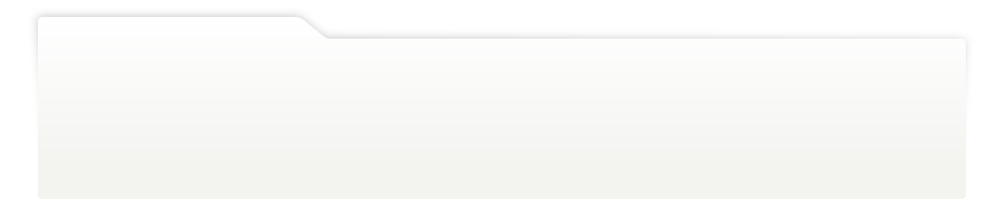
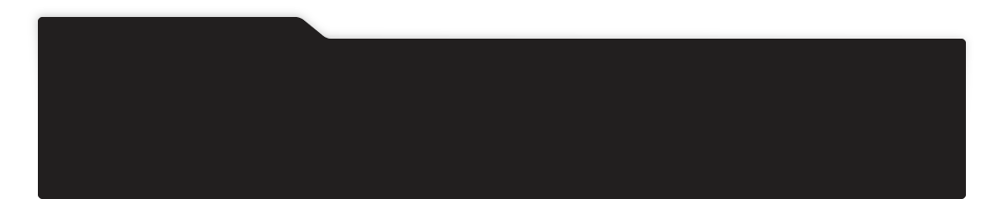
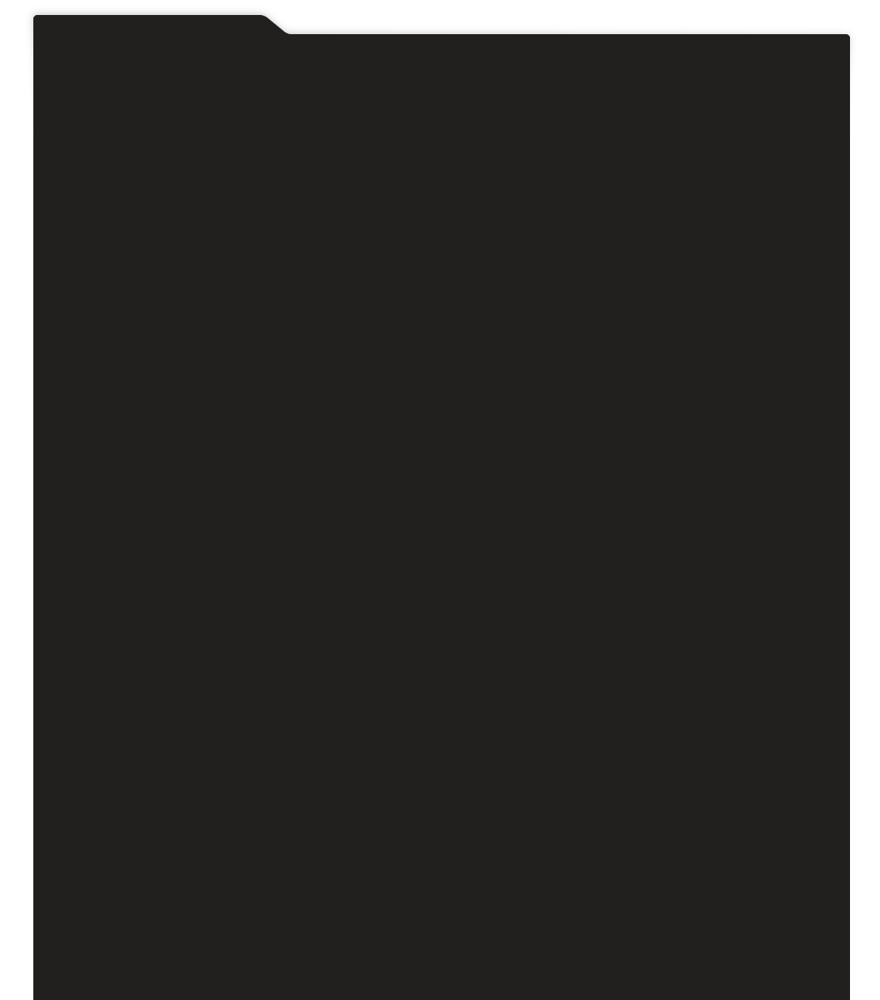
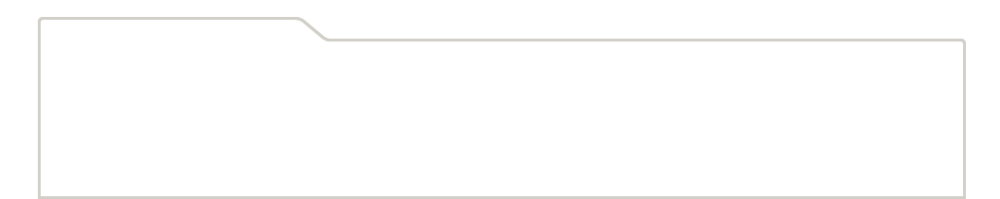
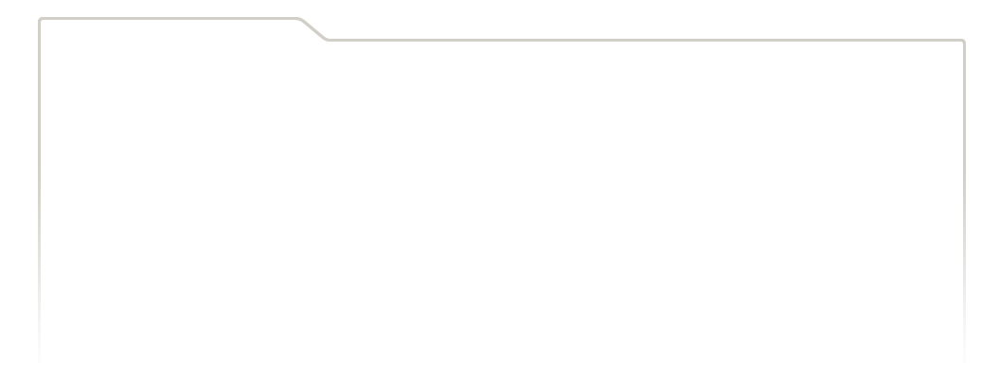
...
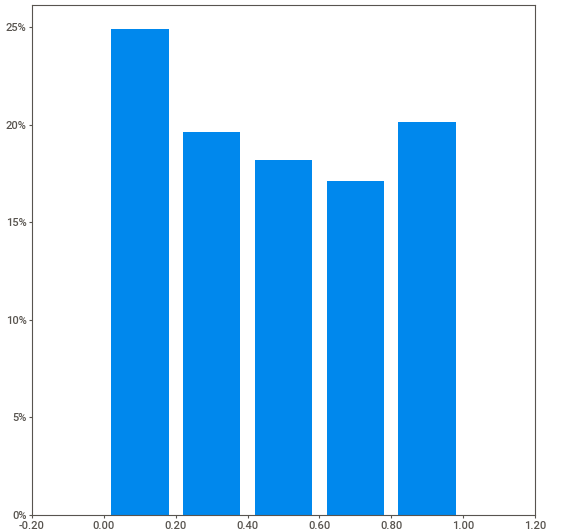
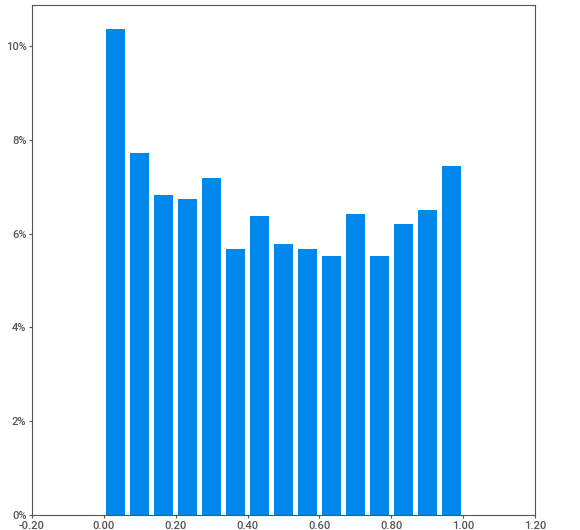
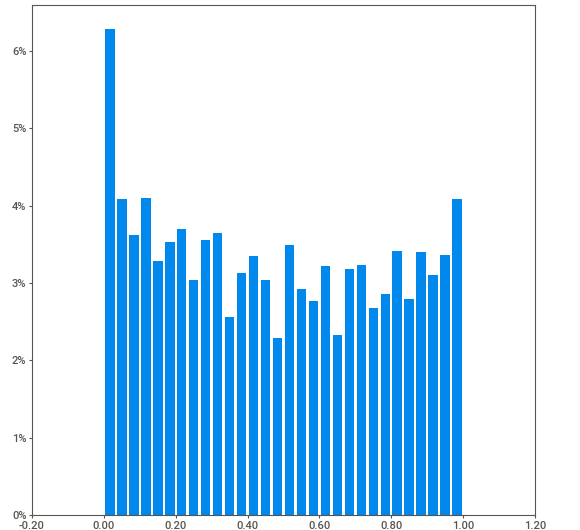
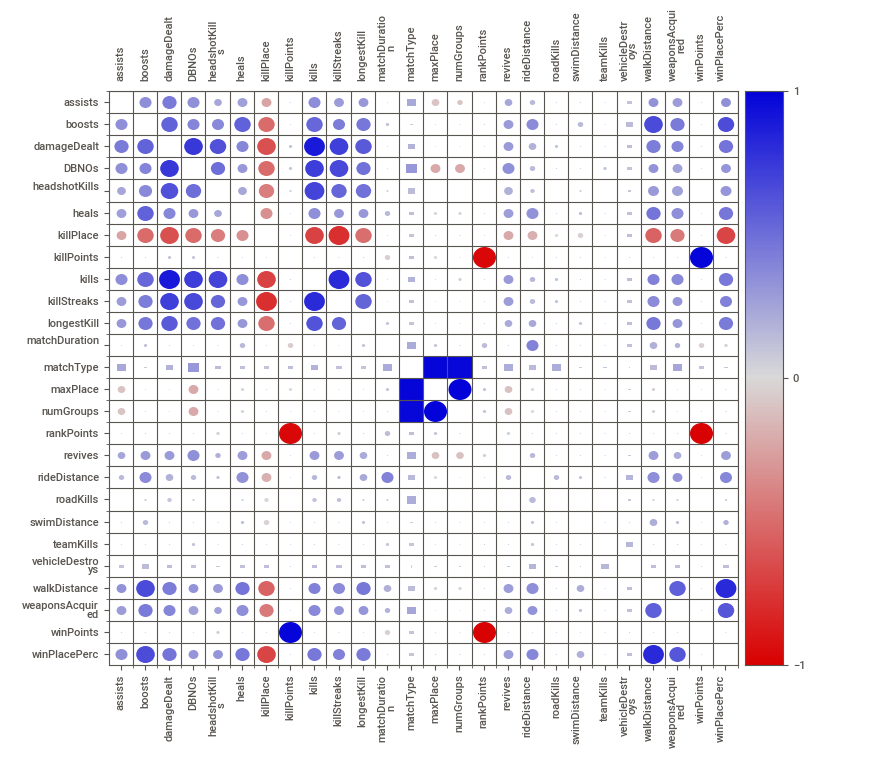
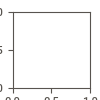

In [ ]:
!pip install sweetviz
import sweetviz as sv
my_report = sv.analyze(df)
my_report.show_notebook()


## Exploring Different Match Type
PUBG offers 3 different game modes:

* Solo - One can play alone (solo,solo-fpp,normal-solo,normal-solo-fpp)
* Duo - Play with a friend (duo,duo-fpp,normal-duo,normal-duo-fpp,crashfpp,crashtpp)
* Squad - Play with 4 friends (squad,squad-fpp,normal-squad,normal-squad-fpp,flarefpp,flaretpp)
1. First Person Perspective (FPP)
2. Third Person Perspective (TPP)

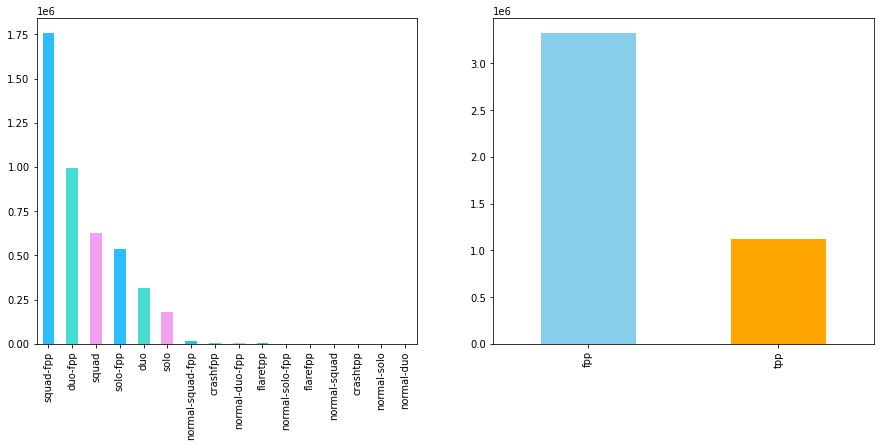

In [9]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

df['matchType'].value_counts().plot.bar(ax=ax[0],color=['#2CBDFE','#47DBCD',"#F3A0F2"])

mapper = lambda y: 'fpp' if ('fpp' in y) else 'tpp'
df["perspective"] = df['matchType'].apply(mapper)
df["perspective"].value_counts().plot.bar(ax=ax[1],color=['skyblue','orange'])
plt.show()

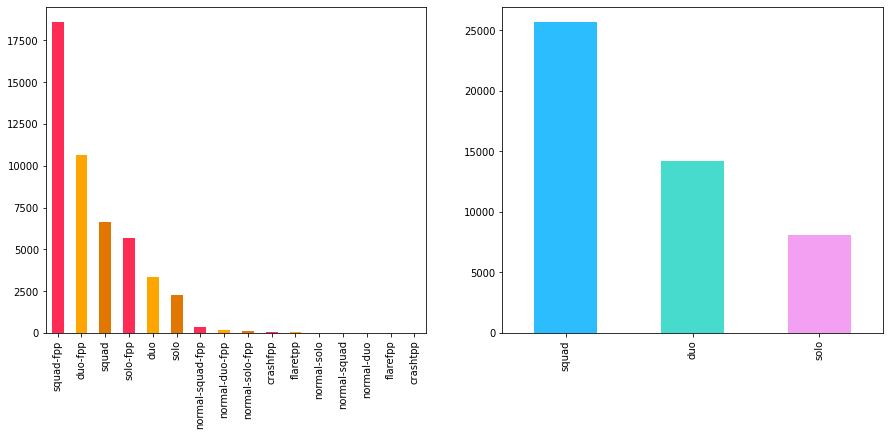

In [10]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

df.groupby('matchId')['matchType'].first().value_counts().plot.bar(ax=ax[0],color=['xkcd:reddish pink','orange',"#e17701"])

mapper = lambda x: 'solo' if ('solo' in x) else 'duo' if ('duo' in x) or ('crash' in x) else 'squad'
df['matchType'] = df['matchType'].apply(mapper)
df.groupby('matchId')['matchType'].first().value_counts().plot.bar(ax=ax[1],color=['#2CBDFE','#47DBCD',"#F3A0F2"])
plt.show()

## Player Analysis
* players in match and group

During a game, 100 players join the same server
1. In the case of duos the max teams are 50
2. In the case of squads the max teams are 25

In [11]:
def mergeList(list1,list2):
    return list(itertools.product(list1,list2))
match = df.groupby(['matchType','matchId']).size().to_frame('Players in Match')
group = df.groupby(['matchType','matchId','groupId']).size().to_frame('Players in Group')
pd.concat([match.groupby('matchType').describe()[mergeList(['Players in Match'],['min','mean','max'])], 
           group.groupby('matchType').describe()[mergeList(['Players in Group'],['min','mean','max'])]], axis=1)

Players in Match                   Players in Group                
                       min       mean    max              min      mean   max
matchType                                                                    
duo                    7.0  92.985658  100.0              1.0  2.050456  72.0
solo                   1.0  89.031872  100.0              1.0  1.039249  64.0
squad                  5.0  93.723193  100.0              1.0  3.492575  74.0

In [12]:
print(group['Players in Group'].nlargest(5))

matchType  matchId         groupId       
squad      b30f3d87189aa6  14d6b54cdec6bc    74
duo        3e029737889ce9  b8275198faa03b    72
solo       41a634f62f86b7  128b07271aa012    64
duo        7e93ce71ac6f61  7385e5fe214021    49
squad      3c2531adf5b942  e52a2e6ca30474    36
Name: Players in Group, dtype: int64


# kills

In [13]:
print("\033[1m\nOn an average a person kills {:.4f} players, 99% of people have {} kills or less, while the maximum kills ever recorded is {}.".format(df['kills'].mean(),
                                                                                                                                                       df['kills'].quantile(0.99),
                                                                                                                                                       df['kills'].max()))


On an average a person kills 0.9248 players, 99% of people have 7.0 kills or less, while the maximum kills ever recorded is 72.


In [14]:
data = df.copy()
# Converting Labeled data to Numerical data using label Encoder
from sklearn.preprocessing import LabelEncoder
label = LabelEncoder()
data[['Id', 'groupId', 'matchId', 'matchType']] = data[['Id', 'groupId', 'matchId', 'matchType']].apply(label.fit_transform)

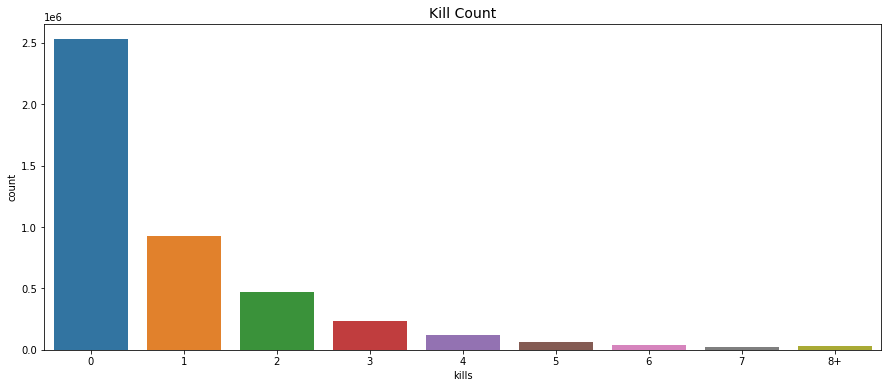

In [15]:
data.loc[data['kills'] > data['kills'].quantile(0.99)] = '8+'
plt.figure(figsize=(15,6))
sns.countplot(data['kills'].astype('str').sort_values())
plt.title("Kill Count",fontsize=14)
plt.show()

#### It seems most of the people cannot even make a single kill. But atleast they deal with some damage

## headshotKills<br>
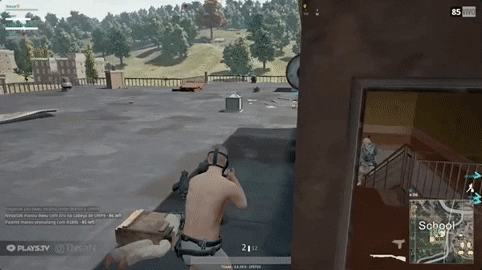

In [16]:
print("\033[1m An average person headshotKills is {:.1f}, 99% of people having headshotKills {} or less, while the maximum headshotKills is {}.".format(df['headshotKills'].mean(), df['headshotKills'].quantile(0.99), df['headshotKills'].max()))

 An average person headshotKills is 0.2, 99% of people having headshotKills 3.0 or less, while the maximum headshotKills is 64.


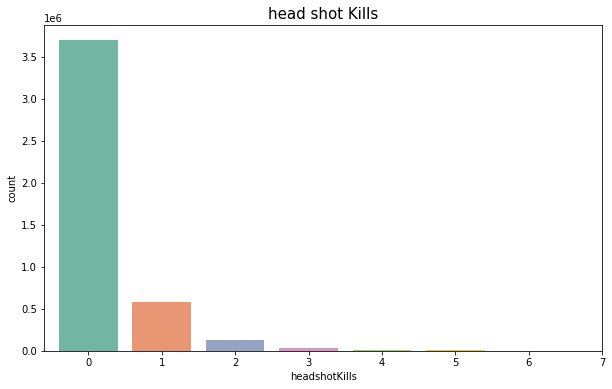

In [17]:
plt.figure(figsize=(10,6))
sns.countplot(df['headshotKills'],palette='Set2')
plt.title("head shot Kills",fontsize=15)
plt.xlim(-0.6,7)
plt.show()

#### Most of the people cannot even make a single headshotkill

## damageDealt

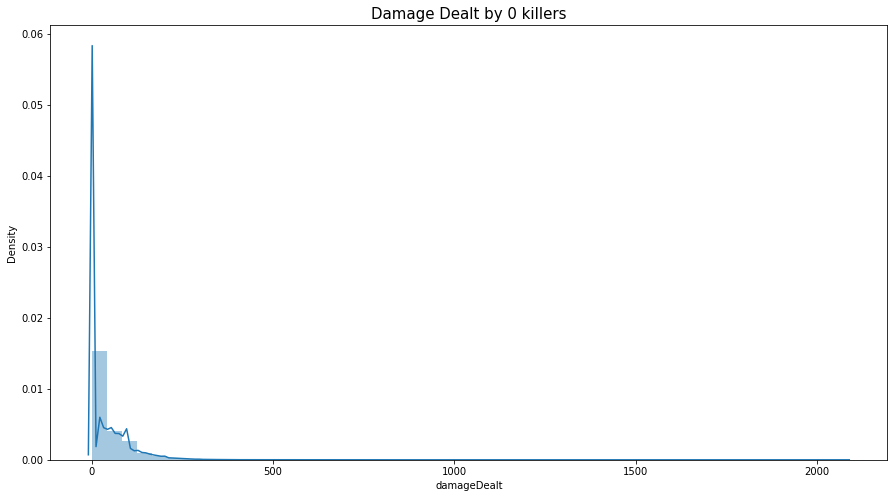

In [18]:
data = df[df['kills']==0]
plt.figure(figsize=(15,8))
plt.title("Damage Dealt by 0 killers",fontsize=15)
sns.distplot(data['damageDealt'])
plt.show()

#### There are few people who win without even making a single kill by dealing with damage.

In [19]:
print("\033[1m A total of {} players ({:.4f}%) have won without a single kill!".format(len(df[df['winPlacePerc']==1]), 100*len(df[df['winPlacePerc']==1])/len(df)))
df1 = df[df['damageDealt'] == 0].copy()
print("\033[1m\n A total of {} players ({:.4f}%) have won without dealing damage!".format(len(df1[df1['winPlacePerc']==1]), 100*len(df1[df1['winPlacePerc']==1])/len(df)))

 A total of 127573 players (2.8688%) have won without a single kill!

 A total of 4770 players (0.1073%) have won without dealing damage!



## Effect of Kills on Win Place Percentage

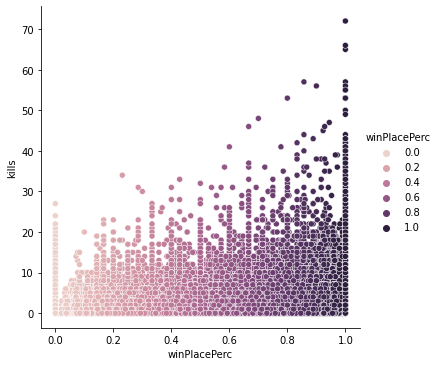

In [20]:
sns.relplot(y=df['kills'], x= df["winPlacePerc"], hue=df["winPlacePerc"],kind='scatter',ci='sd')
plt.show()

#### kills has a high correlation with winPlacePerc.

## Analysing walk Distance

In [21]:
print("\033[1m{} ({:.2f}%) players walked 0 meters. Means either they die before even taking a step or they just joined the game.".format(len(data[data['walkDistance'] == 0]), 100*len(df[df['walkDistance']==0])/len(df)))

98054 (2.24%) players walked 0 meters. Means either they die before even taking a step or they just joined the game.


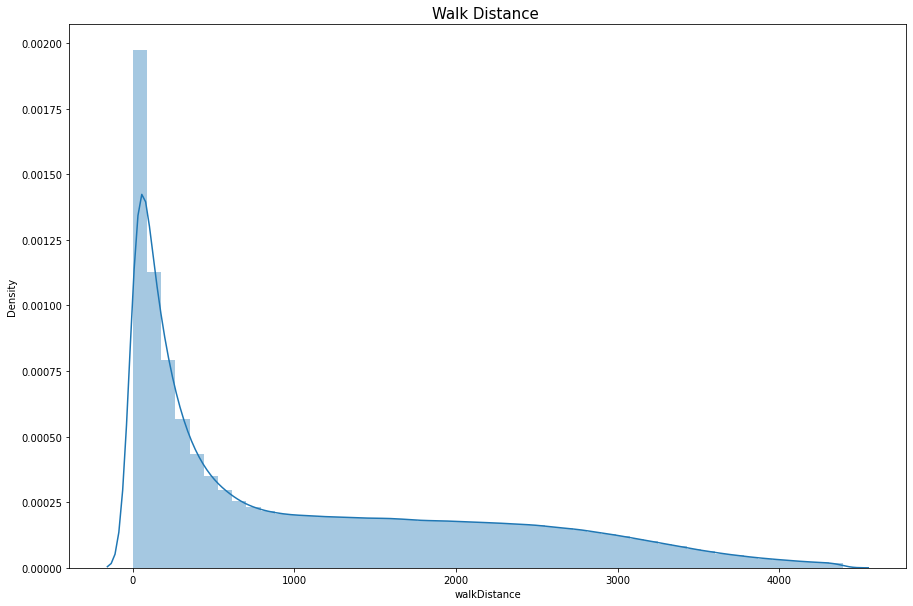

In [22]:
df = df[df['walkDistance'] < df['walkDistance'].quantile(0.99)]
plt.figure(figsize=(15,10))
plt.title("Walk Distance ",fontsize=15)
sns.distplot(df['walkDistance'])
plt.show()

## walk Distance vs winPlacePercentange
#### walkDistance is highly correlated with winPlacePerc
#### As long as you're alive, you will either live to accomplish your goal (<b>Chicken Dinner</b>) or be used as a resource to accomplish someone else's.

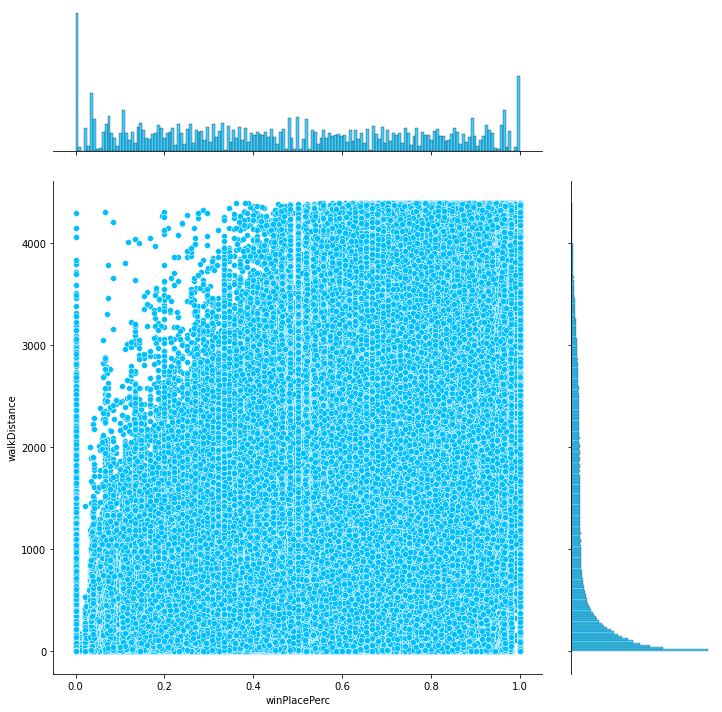

In [23]:
sns.jointplot(x="winPlacePerc", y="walkDistance",  data=df, height=10, ratio=3, color="deepskyblue")
plt.show()

In [24]:
print("\033[1m An average person drives for {:.1f}m, 99% of people have drived {}m or less, while THE RIDER max ride distance is {}m.".format(df['rideDistance'].mean(), df['rideDistance'].quantile(0.99), df['rideDistance'].max()))

 An average person drives for 601.5m, 99% of people have drived 6970.0m or less, while THE RIDER max ride distance is 40710.0m.


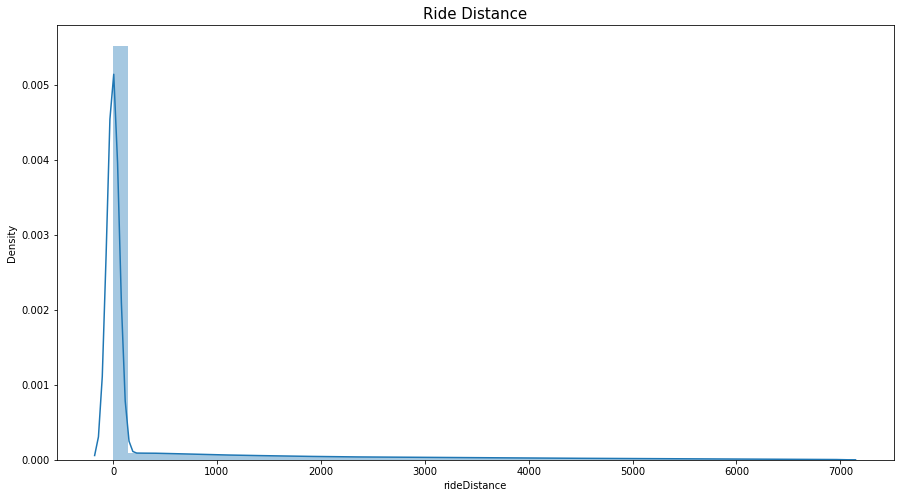

In [25]:
df = df[df['rideDistance'] < df['rideDistance'].quantile(0.99)]
plt.figure(figsize=(15,8))
plt.title("Ride Distance",fontsize=15)
sns.distplot(df['rideDistance'])
plt.show()

In [26]:
print("\033[1m{} players ({:.4f}%) drived for 0 meters. Means they like Trekking more than riding.".format(len(df[df['rideDistance'] == 0]), 100*len(df[df['rideDistance']==0])/len(df)))

3295246 players (75.6066%) drived for 0 meters. Means they like Trekking more than riding.


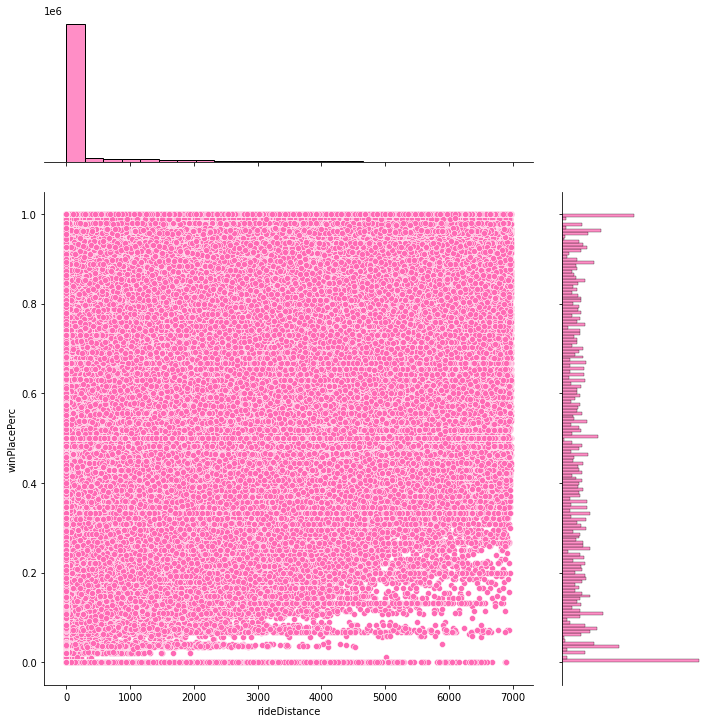

In [27]:
sns.jointplot(x="rideDistance", y="winPlacePerc",  data=df, height=10, ratio=3, color="hotpink")
plt.show()

## VehicleDestroys vs WinPlacePerc analysis

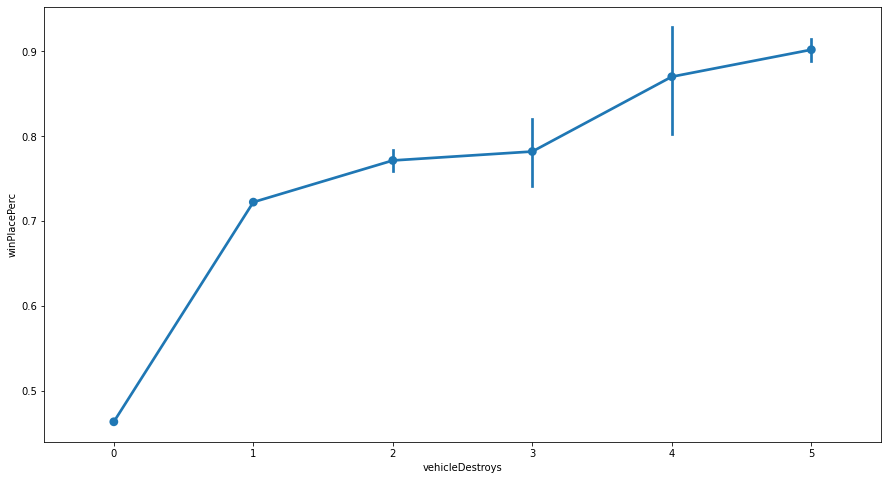

In [28]:
plt.figure(figsize=(15,8))
sns.pointplot(x='vehicleDestroys',y='winPlacePerc',data=df)
plt.show()

#### Destroying vehicles increases your chances of winning!

## VehicleDestroys vs MatchDuration analysis

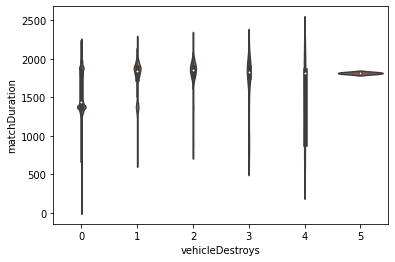

In [29]:
sns.violinplot(x="vehicleDestroys", y="matchDuration", data=df)
plt.show()

## Analysing Healing and Boosting

In [30]:
print("\033[1m In the game on an average a person uses {:.1f} heal items, 99% of people use {} or less, while the Maximum used {}.".format(df['heals'].mean(), df['heals'].quantile(0.99), df['heals'].max()))
print("\033[1m In the game on an average a person uses {:.1f} boost items, 99% of people use {} or less, while the Maximum used {}.".format(df['boosts'].mean(), df['boosts'].quantile(0.99), df['boosts'].max()))

 In the game on an average a person uses 1.3 heal items, 99% of people use 12.0 or less, while the Maximum used 80.
 In the game on an average a person uses 1.1 boost items, 99% of people use 7.0 or less, while the Maximum used 33.


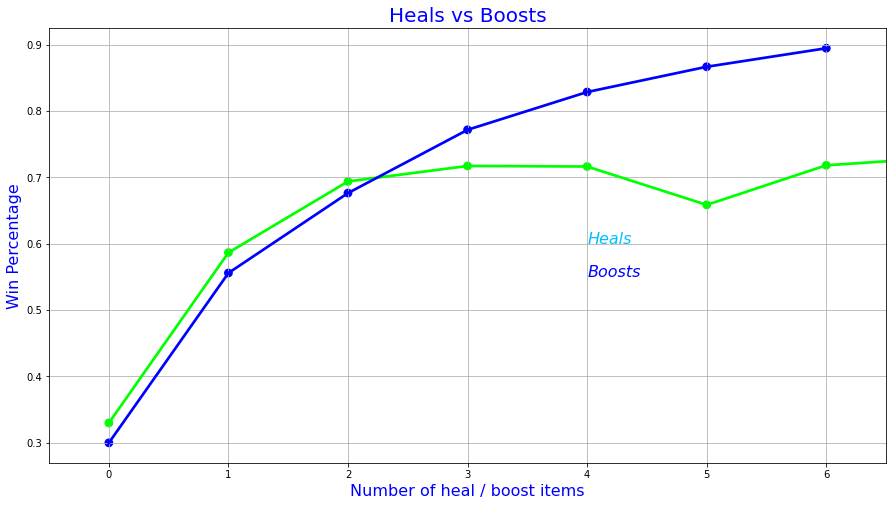

In [31]:
data = df.copy()
data = data[data['heals'] < data['heals'].quantile(0.99)]
data = data[data['boosts'] < data['boosts'].quantile(0.99)]

f,ax1 = plt.subplots(figsize =(15,8))
sns.pointplot(x='heals',y='winPlacePerc',data=data,color='lime',alpha=0.8)
sns.pointplot(x='boosts',y='winPlacePerc',data=data,color='blue',alpha=0.8)
plt.text(4,0.6,'Heals',color='deepskyblue',fontsize = 16,style = 'italic')
plt.text(4,0.55,'Boosts',color='blue',fontsize = 16,style = 'italic')
plt.xlabel('Number of heal / boost items',fontsize = 16,color='blue')
plt.ylabel('Win Percentage',fontsize = 16,color='blue')
plt.title('Heals vs Boosts',fontsize = 20,color='blue')
plt.grid()
plt.show()

# swim Distance

In [32]:
print("\033[1m The average person swims for {:.1f}m, 99% of people have swimmed {}m or less, while the maximum swimmed distance is {}m".format(df['swimDistance'].mean(), df['swimDistance'].quantile(0.99), df['swimDistance'].max()))

 The average person swims for 4.3m, 99% of people have swimmed 119.1m or less, while the maximum swimmed distance is 3823.0m


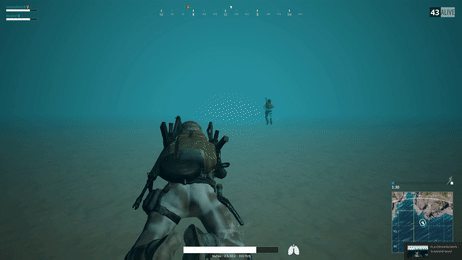

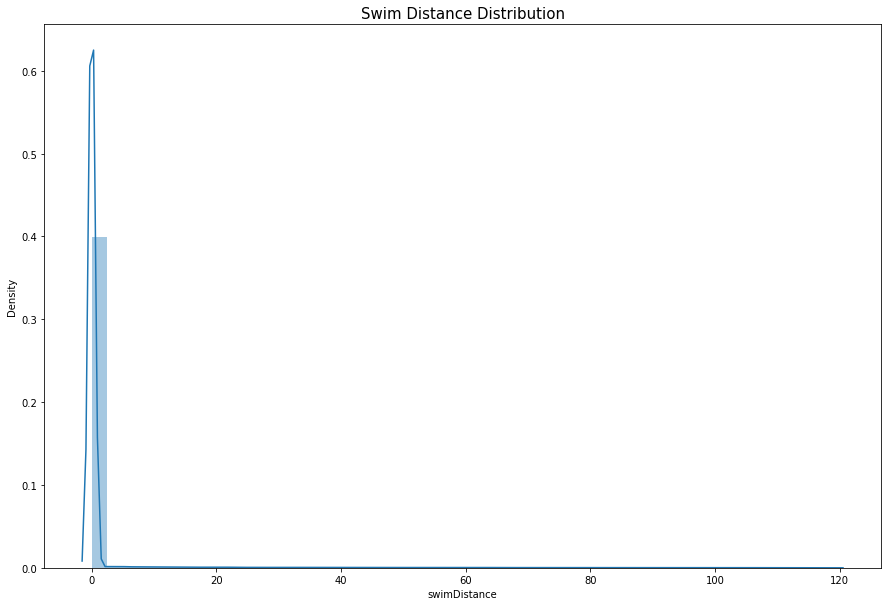

In [33]:
# swim analysis
data = df.copy()
data = data[data['swimDistance'] < df['swimDistance'].quantile(0.99)]
plt.figure(figsize=(15,10))
plt.title("Swim Distance Distribution",fontsize=15)
sns.distplot(data['swimDistance'])
plt.show()

## weapons Acquired

In [34]:
print("\033[1m The average Acquired weapons is {:.1f}, 99% of people have Acquired {} or less, while the maximum weapons Acquired is {}".format(df['weaponsAcquired'].mean(), df['weaponsAcquired'].quantile(0.99), df['weaponsAcquired'].max()))

 The average Acquired weapons is 3.6, 99% of people have Acquired 10.0 or less, while the maximum weapons Acquired is 236


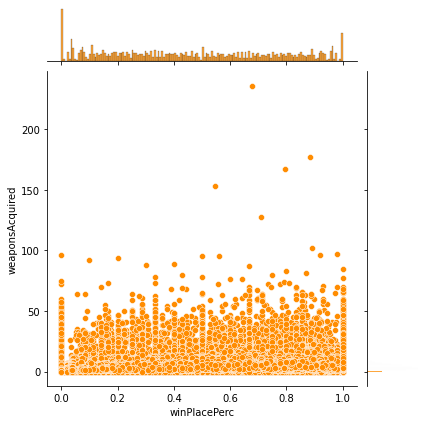

In [35]:
sns.jointplot(data=df, y='weaponsAcquired', x='winPlacePerc',color='darkorange')
plt.show()

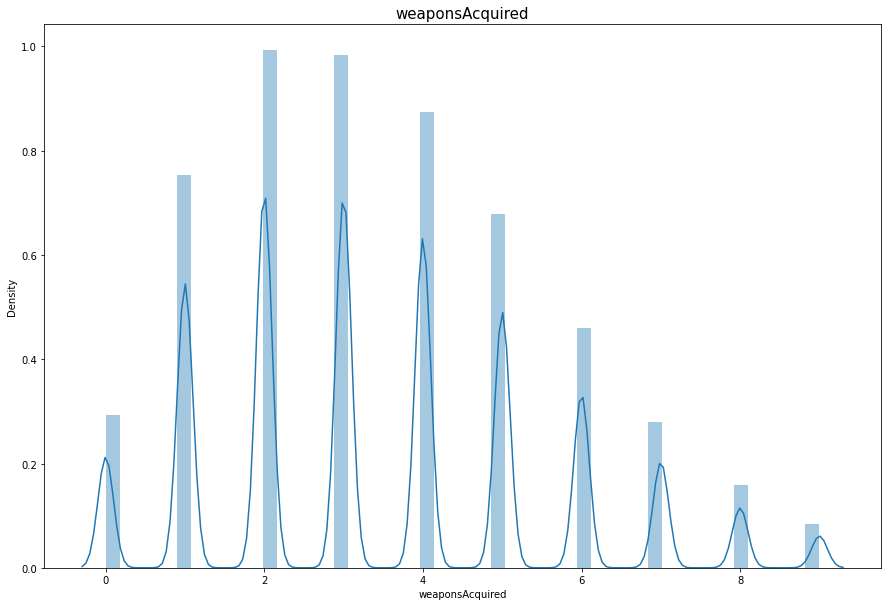

In [36]:
data = df.copy()
data = data[data['weaponsAcquired'] < df['weaponsAcquired'].quantile(0.99)]
plt.figure(figsize=(15,10))
plt.title("weaponsAcquired",fontsize=15)
sns.distplot(data['weaponsAcquired'])
plt.show()

from the above plot, Most of the people Acquired weapons lie  between 2 and 3

## Assists vs KillPlace Plot

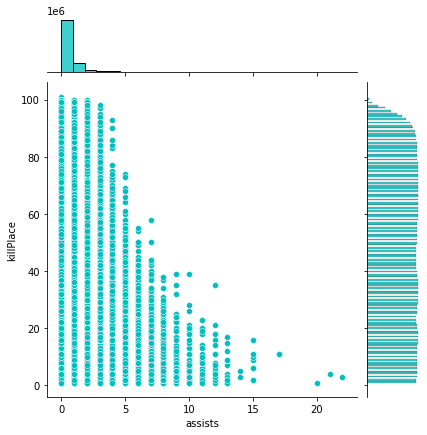

In [37]:
sns.jointplot(data=df, x='assists', y='killPlace',color='c')
plt.show()

## Kills vs Killstreaks analysis

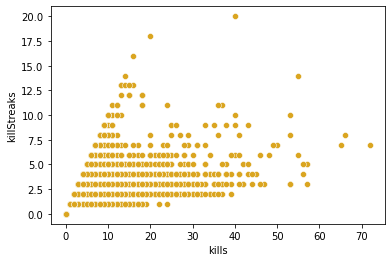

In [38]:
sns.scatterplot(data=df, x="kills", y="killStreaks",color='goldenrod')
plt.show()

In [39]:
print("\033[1m The average of kills {:.1f} , 99% of people have kills {} or less, while the Maximum kills {}.".format(df['kills'].mean(), df['kills'].quantile(0.99), df['kills'].max()))
print("\033[1m The average of killStreaks {:.1f} , 99% of people have killStreaks {} or less, while the Maximum killStreaks is {}.".format(df['killStreaks'].mean(), df['killStreaks'].quantile(0.99), df['killStreaks'].max()))


 The average of kills 0.9 , 99% of people have kills 7.0 or less, while the Maximum kills 72.
 The average of killStreaks 0.5 , 99% of people have killStreaks 3.0 or less, while the Maximum killStreaks is 20.


## Teamkills vs RankPoints analysis

In [40]:
print("\033[1m The average teamKills is {:.1f} , 99% of people have teamKills {} or less, while the Maximum teamKills {}.".format(df['teamKills'].mean(), df['teamKills'].quantile(0.99), df['teamKills'].max()))


 The average teamKills is 0.0 , 99% of people have teamKills 1.0 or less, while the Maximum teamKills 12.


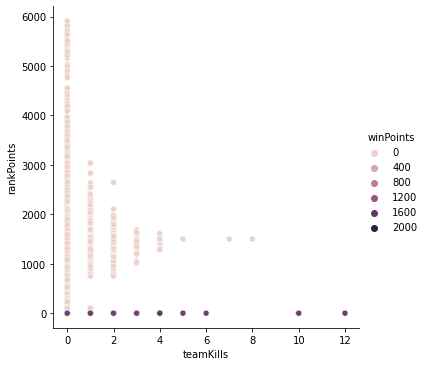

In [41]:
sns.relplot(data=df, x="teamKills", y="rankPoints", hue="winPoints",col_order='maroon')
plt.show()

## Revives vs Kills analysis

In [42]:
print("\033[1m The average of revives {:.1f} , 99% of people have revives {} or less, while the Maximum revives is {}.".format(df['revives'].mean(), df['revives'].quantile(0.99), df['revives'].max()))


 The average of revives 0.2 , 99% of people have revives 2.0 or less, while the Maximum revives is 39.


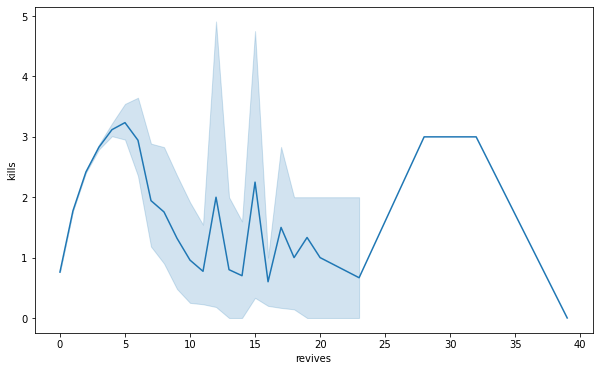

In [43]:
plt.figure(figsize=(10,6))
sns.lineplot(data=df,x='revives',y='kills')
plt.show()

## Killplace vs Kill analysis

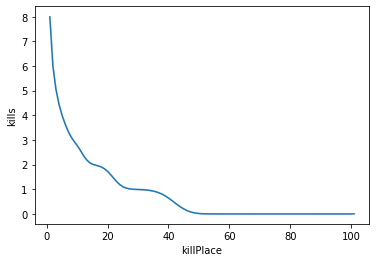

In [44]:
sns.lineplot(data=df,x='killPlace',y='kills')
plt.show()

In [45]:
print("\033[1m The average killPlace is  {:.1f} , 99% of people have killPlace {} or less, while the Maximum killPlace is {}.".format(df['killPlace'].mean(), df['killPlace'].quantile(0.99), df['killPlace'].max()))


 The average killPlace is  48.0 , 99% of people have killPlace 96.0 or less, while the Maximum killPlace is 101.


## vehicleDestroys vs matchDuration

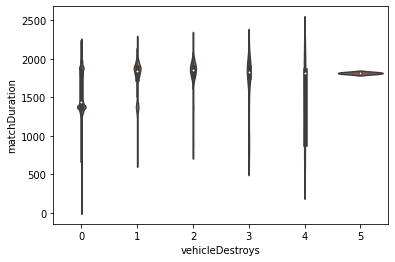

In [46]:
sns.violinplot(x="vehicleDestroys", y="matchDuration", data=df)
plt.show()

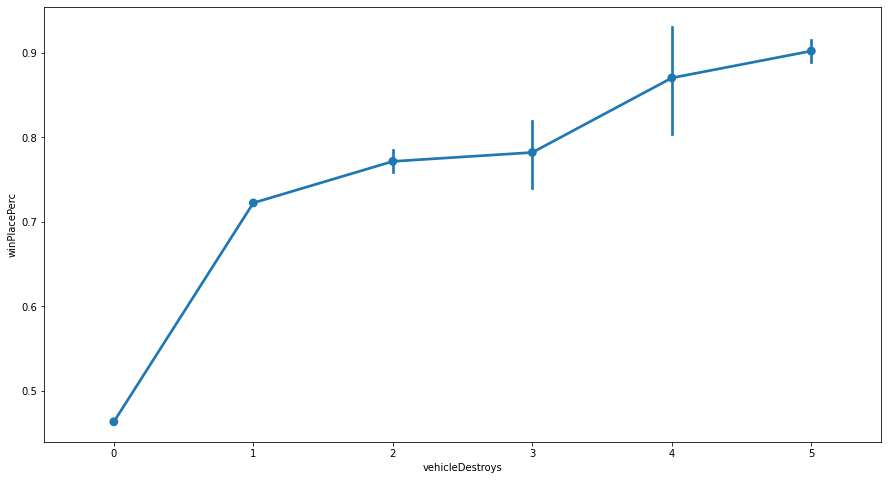

In [47]:
plt.figure(figsize=(15,8))
sns.pointplot(x='vehicleDestroys',y='winPlacePerc',data=df)
plt.show()

## NumGroups vs MatchDuration analysis

In [48]:
print("\033[1m The average numGroups is  {:.1f} , 99% of people having numGroups {} or less, while the Maximum numGroups is {}.".format(df['numGroups'].mean(), df['numGroups'].quantile(0.99), df['numGroups'].max()))


 The average numGroups is  43.1 , 99% of people having numGroups 97.0 or less, while the Maximum numGroups is 100.


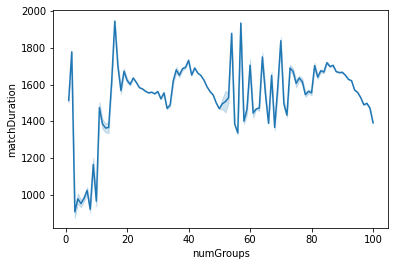

In [49]:
sns.lineplot(data=df,x="numGroups", y="matchDuration")
plt.show()

## longestKill

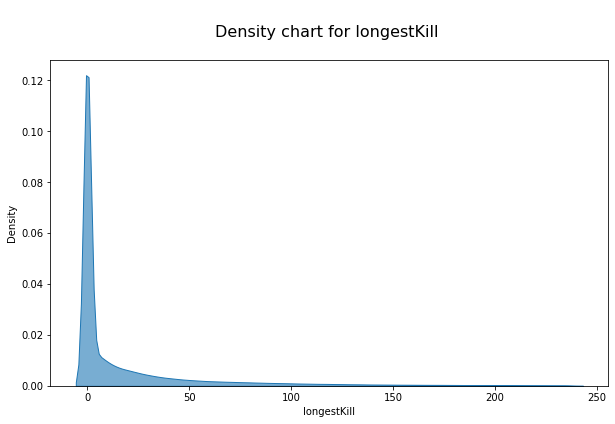

In [50]:
# Density chart
plt.figure(figsize=(10,6))
df = df[df['longestKill'] < df['longestKill'].quantile(0.99)]
sns.kdeplot(df['longestKill'], fill=True,alpha=0.6)
plt.title('\nDensity chart for longestKill \n',fontsize=16,color='black')
plt.show()

## TeamKills vs WeaponsAcquired analysis

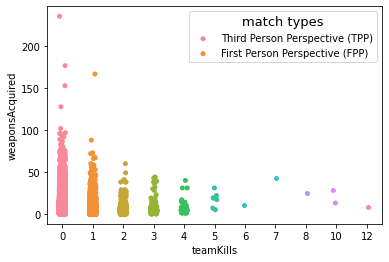

In [51]:
sns.stripplot(x="teamKills", y="weaponsAcquired",data=df)
legend = plt.legend(labels=['Third Person Perspective (TPP)',
                            'First Person Perspective (FPP)'],
                    ncol=1,fontsize=10)
legend.set_title("match types",prop={"size":13})
plt.show()

## MaxPlace vs WinPoints analysis

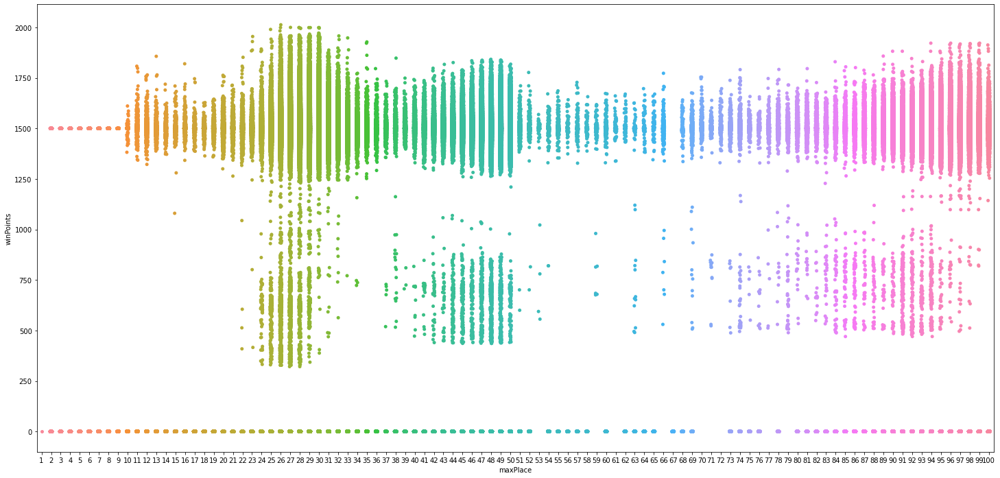

In [52]:
plt.figure(figsize=(25,12))
sns.stripplot(x="maxPlace", y="winPoints",data=df)
  
plt.show()